<a href="https://colab.research.google.com/github/donigantengabis/checkpoint-miniproject-datamining/blob/main/Checkpoint5_Evaluation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ANALISIS TINGKAT CHURN DARI PELANGGAN PERUSAHAAN TELCO**

#**Import Library**

In [229]:
from google.colab import drive
import numpy as np
import ipywidgets as widgets
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier # Algoritma C4.5
from sklearn.preprocessing import StandardScaler
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


#**BUSINESS UNDERSTANDING**

##**Business Objective**

Tujuan utama dari proyek ini adalah untuk mengurangi tingkat churn (pelanggan yang meninggalkan layanan) di perusahaan telekomunikasi. Dengan memahami pola dan faktor yang menyebabkan pelanggan meninggalkan layanan, perusahaan dapat mengambil langkah-langkah proaktif untuk mempertahankan pelanggan yang ada dan mencegah churn di masa depan. Hal ini akan membantu meningkatkan retensi pelanggan, memperkuat pendapatan, dan membangun keunggulan kompetitif.

##**Assess Situation**

Saat ini, perusahaan menghadapi tingkat churn yang signifikan di antara pelanggan mereka. Hal ini dapat mengindikasikan masalah dalam pengalaman pelanggan, kualitas layanan, atau bahkan faktor eksternal seperti persaingan pasar. Analisis lebih lanjut diperlukan untuk memahami alasan di balik churn tersebut. Data internal perusahaan, seperti riwayat penggunaan layanan, profil pelanggan, dan interaksi pelanggan, mungkin akan menjadi sumber informasi utama.

##**Data Mining Goals**

1. Identifikasi Faktor Churn: Mengidentifikasi faktor-faktor yang paling berkontribusi terhadap churn, baik dari segi karakteristik pelanggan (misalnya, lama berlangganan, jenis paket, tingkat penggunaan) maupun pengalaman pelanggan (misalnya, keluhan, interaksi dengan layanan pelanggan).
2. Pembuatan Model Prediktif: Membangun model prediktif yang dapat memperkirakan pelanggan mana yang memiliki risiko tinggi untuk churn di masa mendatang. Ini memungkinkan perusahaan untuk mengambil tindakan pencegahan secara proaktif.
3. Segmentasi Pelanggan: Mengidentifikasi segmentasi pelanggan berdasarkan perilaku dan karakteristik mereka. Ini membantu dalam menyesuaikan strategi retensi yang lebih efektif untuk setiap kelompok pelanggan.
4. Analisis Keseluruhan Perilaku Pelanggan: Menganalisis pola perilaku pelanggan sebelum mereka memutuskan untuk meninggalkan layanan, termasuk tren penggunaan layanan, frekuensi interaksi, dan tingkat kepuasan pelanggan.

##**Project Plan**

1. Data Collection: Mengumpulkan data historis pelanggan yang mencakup riwayat penggunaan layanan, profil pelanggan, interaksi pelanggan, dan data terkait lainnya.
2. Data Preprocessing: Membersihkan data dari nilai-nilai yang hilang atau tidak valid, melakukan transformasi jika diperlukan, dan menyiapkan data untuk analisis lebih lanjut.
3. Exploratory Data Analysis (EDA): Menganalisis data untuk mengidentifikasi pola, anomali, dan korelasi antara variabel. Ini akan membantu dalam pemahaman awal tentang faktor-faktor yang terkait dengan churn.
4. Model Development: Mengembangkan model prediktif menggunakan teknik seperti regresi logistik, pohon keputusan, atau algoritma machine learning lainnya untuk memprediksi pelanggan yang berpotensi churn.
5. Evaluation: Mengevaluasi kinerja model menggunakan metrik seperti akurasi, presisi, recall, dan F1-score. Memvalidasi model dengan menggunakan data yang tidak terlihat sebelumnya untuk menghindari overfitting.
6. Segmentation Analysis: Menganalisis data untuk mengidentifikasi kelompok pelanggan yang berbeda berdasarkan perilaku dan karakteristik mereka.
7. Actionable Insights: Menggunakan hasil analisis untuk merumuskan strategi retensi yang lebih efektif, seperti program loyalitas, penawaran khusus, atau perbaikan layanan.
8. Monitoring and Optimization: Memantau efektivitas strategi retensi yang diimplementasikan dan melakukan penyesuaian jika diperlukan. Terus mengupdate model prediktif dengan data terbaru untuk menjaga relevansi dan kinerja.

#**DATA UNDERSTANDING**

##**Collect Initial Data**

Dataset yang akan dianalisis dalam project ini berasal dari situs yang bernama _Kaggle.com_ . Dataset yang didapatkan ini merupakan sebuah sumber data fiksional dari perusahaan Telco yang menyediakan layanan Internet dan Telepon Rumah kepada 7043 pelanggan di California.

Berikut linknya : [Klik disini](https://www.kaggle.com/datasets/yeanzc/telco-customer-churn-ibm-dataset/data)

In [230]:
df = pd.read_excel(r'/content/gdrive/My Drive/Colab Notebooks/Telco_customer_churn.xlsx')
df.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


##**Describe Data**

####Informasi Dasar

In [231]:
num_rows, num_cols = df.shape
rows_widget = widgets.IntText(value=num_rows, description='Baris:', disabled=True)
cols_widget = widgets.IntText(value=num_cols, description='Kolom:', disabled=True)
display(rows_widget, cols_widget)

IntText(value=7043, description='Baris:', disabled=True)

IntText(value=33, description='Kolom:', disabled=True)

Dataset yang sedang dianalisis kali ini memiliki total jumlah kolom yaitu sebanyak 33 (tiga puluh tiga) dan baris sebanyak 7043 (tujuh ribu empat puluh tiga)



####Informasi Lanjutan

In [232]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         7043 non-null   object 
 1   Count              7043 non-null   int64  
 2   Country            7043 non-null   object 
 3   State              7043 non-null   object 
 4   City               7043 non-null   object 
 5   Zip Code           7043 non-null   int64  
 6   Lat Long           7043 non-null   object 
 7   Latitude           7043 non-null   float64
 8   Longitude          7043 non-null   float64
 9   Gender             7043 non-null   object 
 10  Senior Citizen     7043 non-null   object 
 11  Partner            7043 non-null   object 
 12  Dependents         7043 non-null   object 
 13  Tenure Months      7043 non-null   int64  
 14  Phone Service      7043 non-null   object 
 15  Multiple Lines     7043 non-null   object 
 16  Internet Service   7043 

1. CustomerID: ID unik untuk setiap pelanggan. Tipe data: object (string).

2. Count: Jumlah data yang dihitung. Tipe data: int64 (integer).

3. Country: Negara tempat pelanggan tinggal. Tipe data: object (string).

4. State: Negara bagian atau wilayah tempat pelanggan tinggal. Tipe data: object (string).

5. City: Kota tempat pelanggan tinggal. Tipe data: object (string).

6. Zip Code: Kode pos tempat pelanggan tinggal. Tipe data: int64 (integer).

7. Lat Long: Koordinat lintang dan bujur pelanggan. Tipe data: object (string).

8. Latitude: Koordinat lintang pelanggan. Tipe data: float64 (float).

9. Longitude: Koordinat bujur pelanggan. Tipe data: float64 (float).

10. Gender: Jenis kelamin pelanggan. Tipe data: object (string).

11. Senior Citizen: Menunjukkan apakah pelanggan adalah warga senior atau tidak. Tipe data: object (string).

12. Partner: Menunjukkan apakah pelanggan memiliki pasangan atau tidak. Tipe data: object (string).

13. Dependents: Menunjukkan apakah pelanggan memiliki tanggungan atau tidak. Tipe data: object (string).

14. Tenure Months: Jumlah bulan pelanggan telah menjadi pelanggan. Tipe data: int64 (integer).

15. Phone Service: Menunjukkan apakah pelanggan memiliki layanan telepon atau tidak. Tipe data: object (string).

16. Multiple Lines: Menunjukkan apakah pelanggan memiliki beberapa saluran telepon atau tidak. Tipe data: object (string).

17. Internet Service: Jenis layanan internet yang digunakan oleh pelanggan. Tipe data: object (string).

18. Online Security: Menunjukkan apakah pelanggan memiliki keamanan online atau tidak. Tipe data: object (string).

19. Online Backup: Menunjukkan apakah pelanggan memiliki cadangan online atau tidak. Tipe data: object (string).

20. Device Protection: Menunjukkan apakah pelanggan memiliki perlindungan perangkat atau tidak. Tipe data: object (string).

21. Tech Support: Menunjukkan apakah pelanggan memiliki dukungan teknis atau tidak. Tipe data: object (string).

22. Streaming TV: Menunjukkan apakah pelanggan memiliki layanan streaming TV atau tidak. Tipe data: object (string).

23. Streaming Movies: Menunjukkan apakah pelanggan memiliki layanan streaming film atau tidak. Tipe data: object (string).

24. Contract: Jenis kontrak yang dimiliki pelanggan. Tipe data: object (string).

25. Paperless Billing: Menunjukkan apakah pelanggan menggunakan tagihan tanpa kertas atau tidak. Tipe data: object (string).

26. Payment Method: Metode pembayaran yang digunakan oleh pelanggan. Tipe data: object (string).

27. Monthly Charges: Biaya bulanan yang dibebankan kepada pelanggan. Tipe data: float64 (float).

28. Total Charges: Total biaya yang dibebankan kepada pelanggan. Tipe data: object (string).

29. Churn Label: Menunjukkan apakah pelanggan berhenti berlangganan atau tidak. Tipe data: object (string).

30. Churn Value: Nilai yang menunjukkan apakah pelanggan berhenti berlangganan atau tidak (1 untuk Ya, 0 untuk Tidak). Tipe data: int64 (integer).

31. Churn Score: Skor yang menunjukkan kemungkinan pelanggan berhenti berlangganan. Tipe data: int64 (integer).

32. CLTV: Nilai seumur hidup pelanggan. Tipe data: int64 (integer).

33. Churn Reason: Alasan mengapa pelanggan berhenti berlangganan (jika berlaku). Tipe data: object (string).

**Semua kolom data diatas terisi baris 7043 data (non null) kecuali pada kolom _Churn Reason_ yang terisi 1869 baris data.**

####Informasi Statistik Deskriptif

In [233]:
df.describe()

,Count,Zip Code,Latitude,Longitude,Tenure Months,Monthly Charges,Churn Value,Churn Score,CLTV
count,7043.0,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,1.0,93521.964646,36.282441,-119.798880,32.371149,64.761692,0.265370,58.699418,4400.295755
std,0.0,1865.794555,2.455723,2.157889,24.559481,30.090047,0.441561,21.525131,1183.057152
min,1.0,90001.000000,32.555828,-124.301372,0.000000,18.250000,0.000000,5.000000,2003.000000
25%,1.0,92102.000000,34.030915,-121.815412,9.000000,35.500000,0.000000,40.000000,3469.000000
50%,1.0,93552.000000,36.391777,-119.730885,29.000000,70.350000,0.000000,61.000000,4527.000000
75%,1.0,95351.000000,38.224869,-118.043237,55.000000,89.850000,1.000000,75.000000,5380.500000
max,1.0,96161.000000,41.962127,-114.192901,72.000000,118.750000,1.000000,100.000000,6500.000000


* Count: Setiap baris dalam dataset mewakili satu pelanggan.

* Zip Code: Kode pos tempat tinggal pelanggan, dengan rata-rata sekitar 93521.

* Latitude: Garis lintang tempat tinggal pelanggan, dengan rata-rata sekitar 36.28.

* Longitude: Garis bujur tempat tinggal pelanggan, dengan rata-rata sekitar -119.80.

* Tenure Months: Jumlah bulan pelanggan telah menggunakan layanan, dengan rata-rata sekitar 32.37 bulan.

* Monthly Charges: Biaya bulanan yang dibebankan kepada pelanggan, dengan rata-rata sekitar $64.76.

* Churn Value: Menunjukkan apakah pelanggan berhenti berlangganan (1 untuk Ya, 0 untuk Tidak), sekitar 26.5% pelanggan telah berhenti berlangganan.

* Churn Score: Skor yang menunjukkan kemungkinan pelanggan berhenti berlangganan, dengan rata-rata sekitar 58.70.

* CLTV: Nilai waktu hidup pelanggan, dengan rata-rata sekitar 4400.30.

##**Exploratory Data Analysis**

In [234]:
Churn_Label_counts= df['Churn Label'].value_counts()
fig2 = px.pie(names= Churn_Label_counts.keys(), values= Churn_Label_counts.values, title='Persebaran Data Churn Label')
fig2.show()

Sebanyak 26.5% pelanggan atau lebih tepatnya 1869 pelanggan telah meninggalkan layanan perusahaan. Kita perlu mencari tahu apa alasan dari mereka meniggalkan layanan perusahaan.

In [235]:
values= df['Churn Reason'].value_counts(ascending=False).values
keys= df['Churn Reason'].value_counts(ascending=False).keys()

fig = px.bar(x=keys, y=values, color = values, text = values)

fig.update_layout(
    yaxis_title="Churn Reason",
    xaxis_title="Jumlah"
)
fig.show()

Terdapat 2 faktor yang menjadi penyebab pelanggan berhenti dari layanan:
*   Internal
*   External

Faktor internal bisa berupa dari kualitas layanan yang kita jual sendiri dan faktor external dapat berupa kompetitor yang menyaingi perusahaan kita sendiri, untuk itu kualitas dari layanan perusahaan perlu ditingkatkan dengan tujuan memuaskan pelanggan dan juga menyaingi produk layanan perusahaan lain untuk menarik pelanggan pelanggan baru.

In [236]:
contingency_table = pd.crosstab(df['Churn Reason'], df['City'])
top_10_cities = contingency_table.sum().nlargest(10).index
contingency_table_top_10 = contingency_table[top_10_cities]
contingency_table_top_10 = contingency_table_top_10.reset_index()
fig = px.bar(contingency_table_top_10, x='Churn Reason', y=top_10_cities, title='Churn Reason dari 10 Kota',
             labels={'Churn Reason': 'Churn Reason', 'value': 'Jumlah', 'variable': 'Kota'},
             barmode='stack')
fig.show()

Dari visualisasi ini, kita dapat melihat perbandingan jumlah churn reason di antara kota-kota teratas, yang dapat membantu dalam memahami tren churn dan memprioritaskan area-area mana yang perlu perbaikan pelayanan. Sebagai contohnya dari kota Los Angeles dibutuhkan kualitas layanan yang lebih baik dikarenakan banyak pelanggan yang berhenti dari layanan dengan alasan memilih produk dari perusahaan lain dan kurangnya kualitas layanan dari kita.

##**Verify Data Quality**

####Missing Values

In [237]:
missing_values = df.isnull().sum().reset_index()
missing_values.columns = ['Kolom', 'kosong']
fig = px.bar(missing_values, x='Kolom', y='kosong',
             title='Data yang Kosong dalam Dataset',
             labels={'kosong': 'Jumlah Data Kosong'})
fig.update_layout(xaxis_title='Kolom', yaxis_title='Jumlah Data yang Kosong')
fig.show()

Semua kolom data dalam dataset ini rata-rata terisi semua (tidak ada yang kosong) selain kolom _Churn Reason_ dengan jumlah data yang kosong yaitu sebanyak 5174 baris data.

####Outliers Values

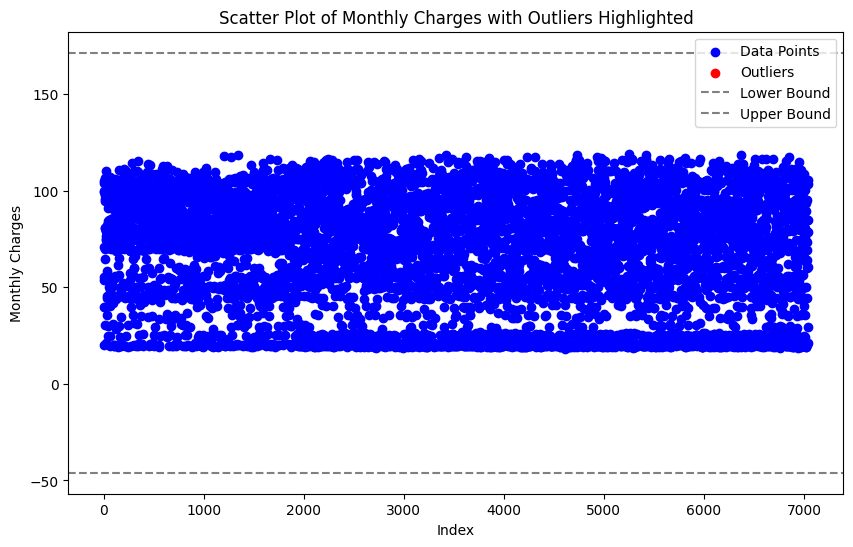

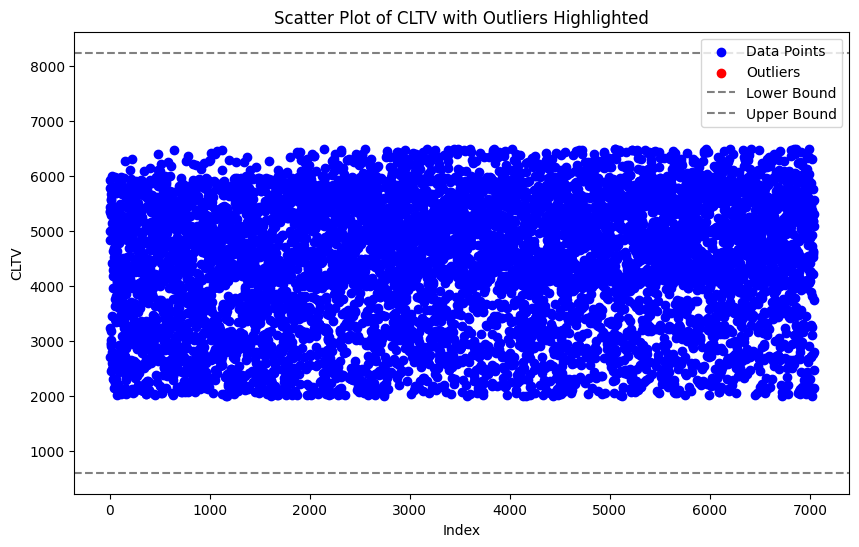

In [238]:
columns_to_check = ['Monthly Charges', 'CLTV']

for column in columns_to_check:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    plt.figure(figsize=(10, 6))
    plt.scatter(df.index, df[column], color='blue', label='Data Points')
    plt.scatter(outliers.index, outliers[column], color='red', label='Outliers')
    plt.axhline(y=lower_bound, color='gray', linestyle='--', label='Lower Bound')
    plt.axhline(y=upper_bound, color='gray', linestyle='--', label='Upper Bound')
    plt.title(f'Scatter Plot of {column} with Outliers Highlighted')
    plt.xlabel('Index')
    plt.ylabel(column)
    plt.legend()
    plt.show()

Dari visualisasi diatas menunjukkan bahwa pelanggan memiliki biaya bulanan _Monthly Charges_ dan nilai waktu hidup _CLTV_ yang beragam, tetapi tidak ada nilai yang dianggap sebagai outliers. Oleh karena itu, tidak perlu dilakukan tindakan lebih lanjut terkait dengan outliers dalam kedua kolom tersebut.

####Duplicated Values

In [239]:
for column in df.columns:
    value_counts = df[column].value_counts()
    fig = px.scatter(x=value_counts.index, y=value_counts.values, labels={'x': column, 'y': 'Frequency'}, title=f'Scatter Plot of {column}')
    fig.update_traces(mode='markers', marker=dict(size=8))
    fig.show()

Dari visualisasi scatter plot diatas, dapat dilihat bahwa data-data yang ditampilkan cukup beragam dan juga ada duplikasi yang jumlahnya tidak sedikit. Tetapi duplikasi tersebut tidak menurunkan kualitas data yang dimiliki karena memang tidak memengaruhi apapun. Untuk detail dari berapa jumlah data terduplikasi anda bisa mengarahkan kursor ke titik dari visual data diatas.

####Inconsistent Values / Noise (Optional)

In [240]:
df_numeric = df.apply(pd.to_numeric, errors='coerce')
fig = px.box(df_numeric, title='Box Plot of Data')
fig.show()
fig = px.violin(df_numeric, title='Violin Plot of Data')
fig.show()

Dari visualisasi diatas dapat dilihat bahwa distribusi nilai dalam data tidak ada yang berbeda secara signifikan sehingga tidak ditemukan adanya noise

# **DATA PREPARATION**

##**Data Cleaning**

###**Penanganan Missing Values**

In [241]:
print((df.isna().sum() / len(df)) * 100)

CustomerID            0.000000
Count                 0.000000
Country               0.000000
State                 0.000000
City                  0.000000
Zip Code              0.000000
Lat Long              0.000000
Latitude              0.000000
Longitude             0.000000
Gender                0.000000
Senior Citizen        0.000000
Partner               0.000000
Dependents            0.000000
Tenure Months         0.000000
Phone Service         0.000000
Multiple Lines        0.000000
Internet Service      0.000000
Online Security       0.000000
Online Backup         0.000000
Device Protection     0.000000
Tech Support          0.000000
Streaming TV          0.000000
Streaming Movies      0.000000
Contract              0.000000
Paperless Billing     0.000000
Payment Method        0.000000
Monthly Charges       0.000000
Total Charges         0.000000
Churn Label           0.000000
Churn Value           0.000000
Churn Score           0.000000
CLTV                  0.000000
Churn Re

Nilai yang kosong dalam dataset terdapat pada kolom Churn Reason dengan persentase 73.463013%

In [242]:
df = df.drop('Churn Reason', axis=1)

In [243]:
df

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,2569-WGERO,1,United States,California,Landers,92285,"34.341737, -116.539416",34.341737,-116.539416,Female,...,No internet service,Two year,Yes,Bank transfer (automatic),21.15,1419.4,No,0,45,5306
7039,6840-RESVB,1,United States,California,Adelanto,92301,"34.667815, -117.536183",34.667815,-117.536183,Male,...,Yes,One year,Yes,Mailed check,84.80,1990.5,No,0,59,2140
7040,2234-XADUH,1,United States,California,Amboy,92304,"34.559882, -115.637164",34.559882,-115.637164,Female,...,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No,0,71,5560
7041,4801-JZAZL,1,United States,California,Angelus Oaks,92305,"34.1678, -116.86433",34.167800,-116.864330,Female,...,No,Month-to-month,Yes,Electronic check,29.60,346.45,No,0,59,2793


Karena data yang kosong lebih 70%, maka kita wajib menghapusnya.

###**Penanganan Duplicated Values**

In [244]:
df[df.duplicated()]

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV


Setelah melakukan pengecekkan, tidak ada ditemukan nilai yang duplikat

###**Penanganan Outliers**

In [245]:
results = []

cols = df.select_dtypes(include=['float64', 'int64'])

for col in cols:
  q1 = df[col].quantile(0.25)
  q3 = df[col].quantile(0.75)
  iqr = q3 - q1
  lower_bound = q1 - 1.5*iqr
  upper_bound = q3 + 1.5*iqr
  outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
  percent_outliers = (len(outliers)/len(df))*100
  results.append({'Kolom': col, 'Persentase Outliers': percent_outliers})

# Dataframe dari list hasil
results_df = pd.DataFrame(results)
results_df.set_index('Kolom', inplace=True)
results_df = results_df.rename_axis(None, axis=0).rename_axis('Kolom', axis=1)

# Tampilkan dataframe
display(results_df)

Kolom,Persentase Outliers
Count,0.0
Zip Code,0.0
Latitude,0.0
Longitude,0.0
Tenure Months,0.0
Monthly Charges,0.0
Churn Value,0.0
Churn Score,0.0
CLTV,0.0


Setelah dilakukan pengecekkan, tidak ada ditemukan outliers.

##**Construct Data**

Dataset yang saya pakai sudah memiliki fitur yang lengkap sehingga tidak diperlukan untuk menambah fitur.

##**Data Reduction**

In [246]:
df = df.drop(['Total Charges','Payment Method','Senior Citizen','Country','Count','State','Zip Code','City','Churn Score','Churn Value','CLTV','CustomerID','Lat Long','Latitude','Longitude'], axis = 1)

In [247]:
df_corr = df.corr(numeric_only=True)
px.imshow(df_corr)

Menghapus seluruh kolom kecuali Tenure Months, Monthly Charger, Churn Value, Churn Score, dan CLTV untuk mempermudah tahap Modelling.

##**Data Transfirmation**

In [248]:
df['Gender'] = df['Gender'].map({'Male':0,'Female':1})
df['Partner'] = df["Partner"].map({'Yes':1,'No':0})
df['Dependents'] = df["Dependents"].map({'Yes':1,'No':0})
df['Phone Service'] = df["Phone Service"].map({'Yes':1,'No':0})
df['Multiple Lines'] = df["Multiple Lines"].map({'Yes':1,'No':0,'No phone service':0})
df['Churn Label'].replace(to_replace='Yes', value=1, inplace=True)
df['Churn Label'].replace(to_replace='No',  value=0, inplace=True)
df["Internet Service"] = df["Internet Service"].map({'DSL':0,'Fiber optic':1,'No':2})
df['Online Security'] = df["Online Security"].map({'Yes':1,'No':0,'No internet service':0})
df['Online Backup'] = df["Online Backup"].map({'Yes':1,'No':0,'No internet service':0})
df['Device Protection'] = df["Device Protection"].map({'Yes':1,'No':0,'No internet service':0})
df['Tech Support'] = df["Tech Support"].map({'Yes':1,'No':0,'No internet service':0})
df['Streaming TV'] = df["Streaming TV"].map({'Yes':1,'No':0,'No internet service':0})
df['Streaming Movies'] = df["Streaming Movies"].map({'Yes':1,'No':0,'No internet service':0})
df["Contract"] = df["Contract"].map({'Month-to-month':0, 'Two year':1, 'One year':2})
df['Paperless Billing'] = df["Paperless Billing"].map({'Yes':1,'No':0})

# First we convert TotalCharges to float and then replace with tenure * monthly charges
# Convert 'Total Charges' column to numeric with errors set to 'coerce'
df['Monthly Charges'] = df['Monthly Charges'].astype('int64')


In [249]:
df

,Gender,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Monthly Charges,Churn Label
0,0,0,0,2,1,0,0,1,1,0,0,0,0,0,1,53,1
1,1,0,1,2,1,0,1,0,0,0,0,0,0,0,1,70,1
2,1,0,1,8,1,1,1,0,0,1,0,1,1,0,1,99,1
3,1,1,1,28,1,1,1,0,0,1,1,1,1,0,1,104,1
4,0,0,1,49,1,1,1,0,1,1,0,1,1,0,1,103,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1,0,0,72,1,0,2,0,0,0,0,0,0,1,1,21,0
7039,0,1,1,24,1,1,0,1,0,1,1,1,1,2,1,84,0
7040,1,1,1,72,1,1,1,0,1,1,0,1,1,2,1,103,0
7041,1,1,1,11,0,0,0,1,0,0,0,0,0,0,1,29,0


In [250]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Gender             7043 non-null   int64
 1   Partner            7043 non-null   int64
 2   Dependents         7043 non-null   int64
 3   Tenure Months      7043 non-null   int64
 4   Phone Service      7043 non-null   int64
 5   Multiple Lines     7043 non-null   int64
 6   Internet Service   7043 non-null   int64
 7   Online Security    7043 non-null   int64
 8   Online Backup      7043 non-null   int64
 9   Device Protection  7043 non-null   int64
 10  Tech Support       7043 non-null   int64
 11  Streaming TV       7043 non-null   int64
 12  Streaming Movies   7043 non-null   int64
 13  Contract           7043 non-null   int64
 14  Paperless Billing  7043 non-null   int64
 15  Monthly Charges    7043 non-null   int64
 16  Churn Label        7043 non-null   int64
dtypes: int64(17)
m

#**MENYIMPAN DATAFRAME**

In [251]:
df.to_csv('/content/gdrive/My Drive/Colab Notebooks/Data Cleaned.csv', index=False)


#**MODELLING**

##**Library Tambahan**

**Library Untuk Splitting Data**

In [252]:
from sklearn.model_selection import train_test_split

**Library untuk Normalisasi Data**

In [253]:
from sklearn.preprocessing import MinMaxScaler

**Library Untuk Build Model**

In [254]:
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import accuracy_score

##**Modelling Predict**

###**Pre-Processing**

####**Split Data**

In [255]:
x = df.drop('Churn Label', axis=1)
y = df['Churn Label']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [256]:
y_train.value_counts(normalize=True)

0    0.740162
1    0.259838
Name: Churn Label, dtype: float64

In [257]:
y_test.value_counts(normalize=True)

0    0.721723
1    0.278277
Name: Churn Label, dtype: float64

Pada tahap ini, data dibagi menjadi dua, yang dikenal sebagai pembagian data. Train data digunakan untuk melatih model dataset, sementara test data digunakan untuk menguji kinerja model yang dilatih.

####**Normalisasi Data**

In [258]:
scaler = MinMaxScaler()

x_train_norm = scaler.fit_transform(x_train)

x_test_norm = scaler.transform(x_test)

###**Build and Train Model**

Di tahap ini kita melakukan normalisasi data

In [259]:
gnb = GaussianNB()

gnb.fit(x_train_norm, y_train)

GaussianNB()

Pada tahap ini, model Gaussian Naive Bayes dilatih dan dibuat menggunakan data pelatihan yang telah dinormalisasi (x_train_norm) dan label kelas yang sesuai (y_train). Setelah melakukan pelatihan, model dapat digunakan untuk membuat prediksi berdasarkan data baru.

In [260]:
knn = KNeighborsClassifier()

knn.fit(x_train_norm, y_train)

KNeighborsClassifier()

Pada tahap ini, model K-Nearest Neighbors dibuat dan dilatih menggunakan data pelatihan yang telah dinormalisasi (x_train_norm) dan label kelas yang sesuai (y_train). Untuk memprediksi kelas data uji, model KNN mencari k-neighbors terdekat dari setiap titik data uji dan menggunakan mayoritas suara dari tetangga terdekat tersebut. Setelah melatih model, prediksi dapat dibuat pada data baru.

In [261]:
dtc = DecisionTreeClassifier()

dtc.fit(x_train_norm, y_train)

DecisionTreeClassifier()

Pada tahap ini, model Decision Tree Classifier dibuat dan dilatih menggunakan data pelatihan yang telah dinormalisasi (x_train_norm) dan label kelas yang sesuai (y_train). Decision Tree Classifier adalah model pembelajaran yang menggunakan serangkaian keputusan berhirarki untuk memprediksi label kelas. Setelah melakukan pelatihan, model dapat digunakan untuk membuat prediksi berdasarkan data baru.

###**Begins and Compare Predict**

In [262]:
gnb_pred = gnb.predict(x_test_norm)
knn_pred = knn.predict(x_test_norm)
dtc_pred = dtc.predict(x_test_norm)

In [263]:
x_test = pd.DataFrame(x_test).reset_index(drop=True)

y_test = pd.DataFrame(y_test).reset_index(drop=True)

gnb_col = pd.DataFrame(gnb_pred.astype(int), columns=["gnb_prediction"])
knn_col = pd.DataFrame(knn_pred.astype(int), columns=["knn_prediction"])
dtc_col = pd.DataFrame(dtc_pred.astype(int), columns=["dtc_prediction"])

combined_data = pd.concat([x_test, y_test, gnb_col, knn_col, dtc_col], axis=1)

In [264]:
combined_data.head()

,Gender,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Monthly Charges,Churn Label,gnb_prediction,knn_prediction,dtc_prediction
0,1,0,0,15,1,0,1,0,1,0,0,0,1,0,1,85,1,1,0,1
1,0,1,0,18,1,1,0,0,1,0,0,0,0,0,0,56,0,1,0,0
2,1,0,0,2,1,0,2,0,0,0,0,0,0,0,1,20,0,1,0,0
3,0,1,0,6,1,0,1,0,1,0,0,0,1,0,1,84,1,1,1,1
4,0,0,0,40,1,1,1,0,0,1,1,1,1,0,0,104,1,1,1,1


Pada proses ini, prediksi dilakukan menggunakan tiga model klasifikasi sebelumnya: Gaussian Naive Bayes, K-Nearest Neighbor, dan Decision Tree. Selanjutnya, data uji diubah menjadi DataFrame, indeksnya direset, dan hasil prediksi dari setiap model diubah menjadi DataFrame dengan kolom yang sesuai. Untuk memudahkan perbandingan hasil prediksi dari ketiga model klasifikasi, semua data uji dan hasil prediksi digabungkan menjadi satu DataFrame kombinasi.

##**Modelling Associate**

###**Pre-Processing**

####**Adjustment**

In [265]:
x_final = df.drop("Churn Label", axis=1)

Dalam langkah pertama proses ini, data disesuaikan dengan menghapus kolom "Churn Value" dari DataFrame. Ini dilakukan dengan perintah x_final = df.drop("Churn Value", axis=1), yang membuat data siap untuk langkah berikutnya.

####**Normalisasi Data**

In [266]:
scaler = MinMaxScaler()

x_final_norm = scaler.fit_transform(x_final)

Langkah berikutnya adalah normalisasi data dengan MinMaxScaler. Kita dapat membuat objek scaler MinMaxScaler dengan perintah scaler = MinMaxScaler(). Kemudian, perintah x_final_norm = scaler.fit_transform(x_final) dapat digunakan untuk menormalisasi data yang telah disiapkan sebelumnya. Untuk memastikan konsistensi dalam skala antar fitur dalam dataset, normalisasi data sangat penting.

####**Validasi Silang**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

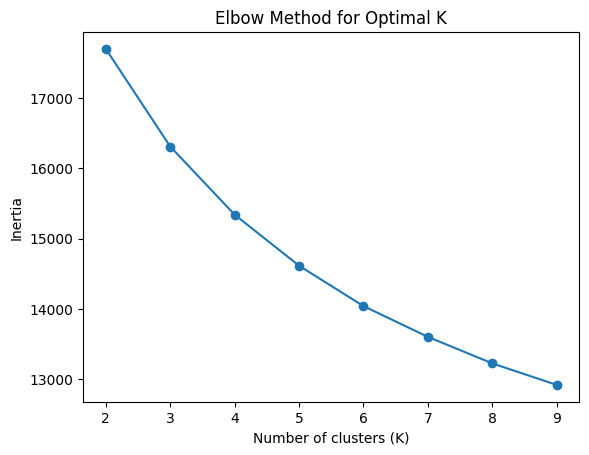

In [267]:
inertia_values = []

k_range = range(2, 10)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(x_final_norm)
    inertia_values.append(kmeans.inertia_)

plt.plot(k_range, inertia_values, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.xticks(k_range)
plt.show()

Langkah terakhir adalah validasi silang menggunakan metode Elbow untuk menentukan jumlah cluster yang ideal. Iterasi dilakukan untuk nilai k, yang merupakan jumlah cluster, mulai dari 2 hingga 9. Untuk setiap iterasi, model K-Means dibuat dengan jumlah cluster tersebut dan inertia disimpan. Visualisasi metode Elbow menunjukkan nilai inertia terhadap jumlah cluster (K). Ini membantu dalam menentukan jumlah cluster yang ideal untuk analisis clustering berikutnya.

###**Build Model**

####**K-Means**

In [268]:
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(x_final_norm)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=4, random_state=42)

Kode di atas menggunakan algoritma K-Means untuk mengelompokkan data ke dalam empat cluster. Data yang telah dinormalisasi sebelumnya (x_final_norm) digunakan untuk melatih model, dan setelah melatih model, kita dapat menggunakan hasilnya untuk mengelompokkan data ke dalam empat cluster yang berbeda.

####**Hierarchical Clustering**

In [269]:
hc = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')

Kode tersebut mengelompokkan data menjadi empat kelompok dengan menggunakan algoritma agglomerative clustering. Metrik jarak yang digunakan adalah metrik euclidean, dan penggabungan klaster adalah proses yang secara bertahap menggabungkan titik atau klaster yang dekat hingga terbentuk empat kelompok.

###**Begins and Compare Clusters**

In [270]:
kmeans_clust = kmeans.predict(x_final_norm)
hierarchy_clust = hc.fit_predict(x_final_norm)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



Dengan menggunakan model K-Means dan Agglomerative Clustering yang telah dilatih sebelumnya, kode ini digunakan untuk memprediksi klaster untuk setiap set data. Untuk model K-Means, kmeans.predict(x_final_norm), dan untuk model Agglomerative Clustering, hc.fit_predict(x_final_norm).

In [271]:
x_final = pd.DataFrame(x_final).reset_index(drop=True)

kmeans_col = pd.DataFrame(kmeans_clust, columns=["kmeans_cluster"])
hierarchy_col = pd.DataFrame(hierarchy_clust, columns=["hierarchy_cluster"])

combined_data_assoc = pd.concat([x_final, kmeans_col, hierarchy_col], axis=1)

Kode ini menggabungkan data asli dengan hasil prediksi klaster dari model Agglomerative Clustering dan K-Means. Prosesnya mencakup:


*   Mengatur ulang indeks data asli.
*   Membuat DataFrame untuk hasil prediksi klaster dari masing-masing model.
*   Menggunakan fungsi pd.concat(), kita menggabungkan data asli dengan hasil prediksi klaster. Hasilnya adalah DataFrame combined_data_assoc, yang berisi klaster dan data asli yang diprediksi oleh model K-Means dan Agglomerative Clustering.

In [272]:
combined_data_assoc.head()

,Gender,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Monthly Charges,kmeans_cluster,hierarchy_cluster
0,0,0,0,2,1,0,0,1,1,0,0,0,0,0,1,53,2,2
1,1,0,1,2,1,0,1,0,0,0,0,0,0,0,1,70,2,0
2,1,0,1,8,1,1,1,0,0,1,0,1,1,0,1,99,3,1
3,1,1,1,28,1,1,1,0,0,1,1,1,1,0,1,104,3,1
4,0,0,1,49,1,1,1,0,1,1,0,1,1,0,1,103,3,1


Kode diatas menampilkan struktur data yang telah digabungkan dengan klaster yang diprediksi dengan menggunakan kombinasi_data_assoc.head() yang menampilkan lima baris pertama dari DataFrame. Ini menggabungkan data asli dengan hasil prediksi klaster dari model K-Means dan Agglomerative Clustering.

#**Evaluation**

##**Evaluate Results**

###**Klasifikasi**

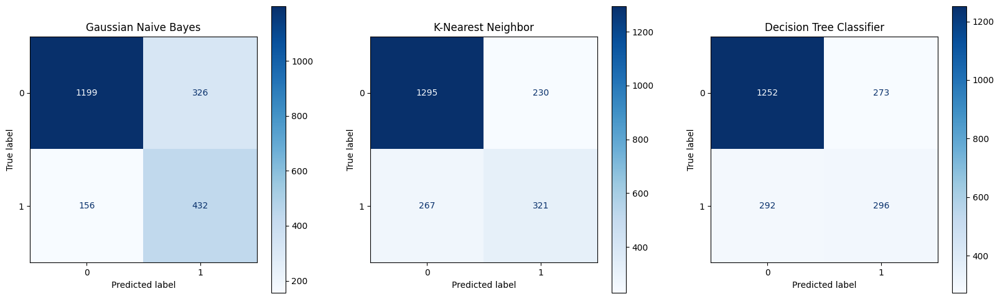

In [273]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20,6))

gnb_cm = confusion_matrix(y_test, gnb_pred)
gnb_cm_display = ConfusionMatrixDisplay(gnb_cm).plot(ax=axes[0], cmap='Blues')
gnb_cm_display.ax_.set_title("Gaussian Naive Bayes")

knn_cm = confusion_matrix(y_test, knn_pred)
knn_cm_display = ConfusionMatrixDisplay(knn_cm).plot(ax=axes[1], cmap='Blues')
knn_cm_display.ax_.set_title("K-Nearest Neighbor")

dtc_cm = confusion_matrix(y_test, dtc_pred)
dtc_cm_display = ConfusionMatrixDisplay(dtc_cm).plot(ax=axes[2], cmap='Blues')
dtc_cm_display.ax_.set_title("Decision Tree Classifier")

plt.show()

Berdasarkan evaluasi yang dilakukan, dapat disimpulkan bahwa model Decision Tree Classifier adalah yang terbaik dari ketiganya. Ini berhasil memprediksi sebagian besar data untuk kedua kelas yang diamati, dan kemampuan model untuk membuat prediksi yang akurat dalam kasus positif dan negatif mendukung kinerjanya.

Selain itu, K-Nearest Neighbor (KNN) juga memiliki hasil yang memuaskan, meskipun sedikit di bawah Decision Tree Classifier. Namun, KNN mampu memperkirakan dengan baik kelas yang diamati dan memiliki kesalahan yang rendah dalam mengklasifikasikan berbagai kelas.

Sementara itu, Gaussian Naive Bayes menunjukkan kinerja paling buruk dari ketiganya. Meskipun memiliki keunggulan dalam memprediksi kelas tertentu, dia masih jauh lebih akurat dan tepat daripada dua model lainnya. Ini menunjukkan bahwa model ini mungkin perlu diubah untuk menjadi lebih baik dalam memprediksi kelas yang diamati.

Oleh karena itu, disarankan untuk menggunakan model Decision Tree Classifier jika tujuan utama adalah akurasi prediksi. Sebaliknya, jika interpretasi model mudah dipahami dan kemampuan memprediksi kelas yang baik menjadi prioritas, K-Nearest Neighbor (KNN) dapat digunakan sebagai alternatif. Meskipun Gaussian Naive Bayes memerlukan modifikasi tambahan sebelum dapat digunakan secara luas.








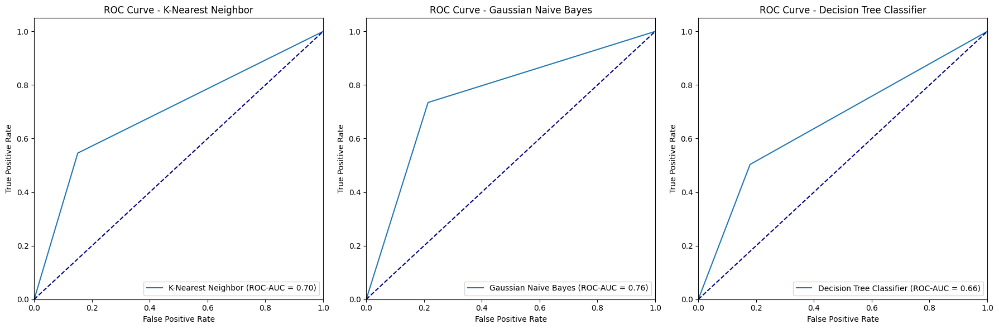

In [275]:
from sklearn.metrics import roc_auc_score, roc_curve

models = [knn, gnb, dtc]
model_names = ['K-Nearest Neighbor', 'Gaussian Naive Bayes', 'Decision Tree Classifier']

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for model, name, ax in zip(models, model_names, axes):
    y_pred = model.predict(x_test_norm)

    fpr, tpr, _ = roc_curve(y_test, y_pred)

    roc_auc = roc_auc_score(y_test, y_pred)

    ax.plot(fpr, tpr, label=f'{name} (ROC-AUC = {roc_auc:.2f})')
    ax.plot([0, 1], [0, 1], color='navy', linestyle='--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(f'ROC Curve - {name}')
    ax.legend(loc='lower right')

plt.tight_layout()
plt.show()

Kode tersebut menghasilkan tiga grafik yang menunjukkan kurva Receiver Operating Characteristic (ROC) untuk tiga model klasifikasi yang berbeda: K-Nearest Neighbor (KNN), Gaussian Naive Bayes, dan Decision Tree Classifier. Setiap kurva ROC menggambarkan hubungan antara tingkat True Positive Rate (TPR) dan False Positive Rate (FPR) saat nilai threshold klasifikasi berubah.

Kurva ROC digunakan untuk mengevaluasi seberapa baik model klasifikasi memisahkan antara kelas positif dan negatif. Semakin dekat kurva ROC ke sudut kiri atas, semakin baik modelnya dalam membedakan kedua kelas tersebut. Nilai Area Under the Curve (AUC) juga diberikan sebagai ukuran kuantitatif dari kualitas kurva ROC, di mana nilai mendekati 1 menandakan kinerja yang lebih baik.

Dalam kode tersebut, setiap subplot menampilkan kurva ROC untuk model klasifikasi yang sesuai, dengan nilai ROC-AUC dicantumkan. Garis putus-putus diagonal menggambarkan performa acak atau tebakan sembarang. Tujuan utama dari visualisasi ini adalah untuk membandingkan performa relatif dari ketiga model klasifikasi dalam memprediksi kelas positif dan negatif.

###**Klustering**

In [276]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

silhouette_avg_kmeans = silhouette_score(x_final_norm, kmeans.labels_)
ch_score_kmeans = calinski_harabasz_score(x_final_norm, kmeans.labels_)
db_score_kmeans = davies_bouldin_score(x_final_norm, kmeans.labels_)

silhouette_avg_hc = silhouette_score(x_final_norm, hierarchy_clust)
ch_score_hc = calinski_harabasz_score(x_final_norm, hierarchy_clust)
db_score_hc = davies_bouldin_score(x_final_norm, hierarchy_clust)

metrics = ["Silhouette Score", "Calinski-Harabasz Score", "Davies-Bouldin Score"]
scores_kmeans = [silhouette_avg_kmeans, ch_score_kmeans, db_score_kmeans]
scores_hc = [silhouette_avg_hc, ch_score_hc, db_score_hc]

df_scores = pd.DataFrame({'': metrics,
                          'KMeans Score': scores_kmeans,
                          'Agglomerative Clustering Score': scores_hc})

df_scores = df_scores.set_index('')

df_scores = df_scores.T

display(df_scores)

,Silhouette Score,Calinski-Harabasz Score,Davies-Bouldin Score
KMeans Score,0.113748,982.661188,2.392645
Agglomerative Clustering Score,0.095459,781.463707,2.836674


Hasil evaluasi metrik untuk dua metode clustering, yaitu KMeans dan Agglomerative Clustering, menunjukkan bahwa KMeans memiliki nilai Silhouette Score yang sedikit lebih tinggi (0.113748) dibandingkan dengan Agglomerative Clustering (0.095459), menandakan bahwa pengelompokan KMeans lebih baik dalam mempertahankan jarak antara pusat cluster dan titik-titik di sekitarnya. Namun, Agglomerative Clustering memiliki nilai Calinski-Harabasz Score yang sedikit lebih rendah (781.463707) dibandingkan dengan KMeans (982.661188), menandakan bahwa pengelompokan KMeans lebih kompak. Meskipun begitu, kedua metode memiliki nilai Davies-Bouldin Score yang serupa, menunjukkan tingkat kepadatan cluster yang serupa pula.

##**Review Process**

###**Cross Validation**

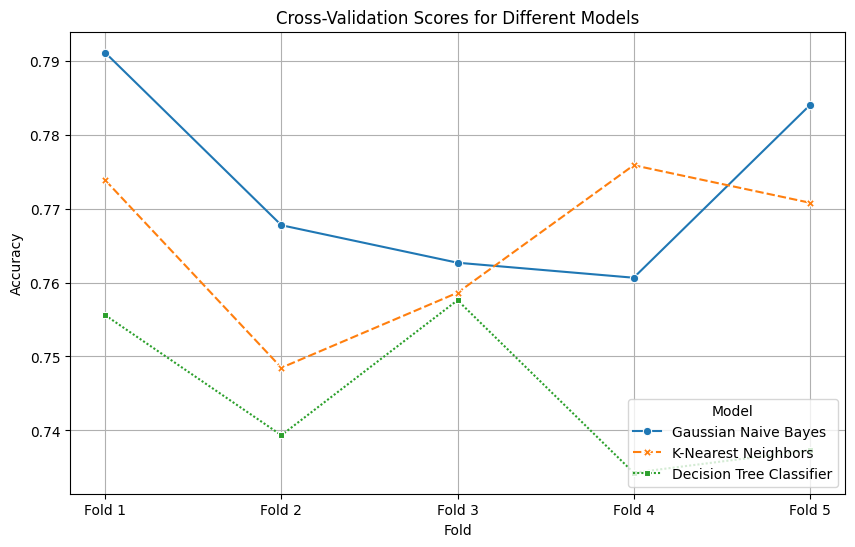

In [277]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_val_score

# Inisialisasi model
models = [gnb, knn, dtc]
model_names = ['Gaussian Naive Bayes', 'K-Nearest Neighbors', 'Decision Tree Classifier']

# Lakukan validasi silang untuk setiap model
cv_scores = []
for model in models:
    scores = cross_val_score(model, x_train_norm, y_train, cv=5)
    cv_scores.append(scores)

# Buat dataframe dari hasil validasi silang
df_cv_scores = pd.DataFrame(cv_scores, index=model_names).T

# Tampilkan visualisasi hasil validasi silang dengan lineplot
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_cv_scores, markers=True)
plt.title('Cross-Validation Scores for Different Models')
plt.xlabel('Fold')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend(title='Model', loc='lower right')
plt.xticks(ticks=range(5), labels=['Fold 1', 'Fold 2', 'Fold 3', 'Fold 4', 'Fold 5'])
plt.show()

Kode tersebut melakukan validasi silang untuk tiga model klasifikasi yang berbeda (Gaussian Naive Bayes, K-Nearest Neighbors, dan Decision Tree Classifier) menggunakan data yang telah dinormalisasi. Hasil validasi silang untuk setiap model kemudian disimpan dalam sebuah DataFrame dan divisualisasikan menggunakan line plot untuk membandingkan akurasi model di setiap lipatan validasi.

###**Feature Selection**

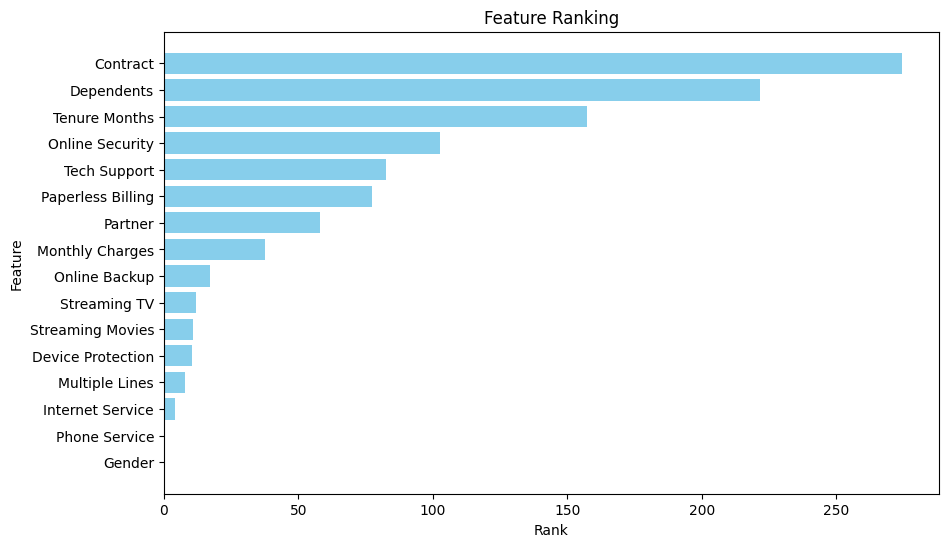

In [278]:
from sklearn.feature_selection import SelectKBest, chi2
import matplotlib.pyplot as plt

selector = SelectKBest(score_func=chi2, k=10)

selector.fit(x_train_norm, y_train)

feature_ranks = selector.scores_

feature_names = x_train.columns

feature_ranks_df = pd.DataFrame({'Feature': feature_names, 'Rank': feature_ranks})

feature_ranks_df = feature_ranks_df.sort_values(by='Rank', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(feature_ranks_df['Feature'], feature_ranks_df['Rank'], color='skyblue')
plt.xlabel('Rank')
plt.ylabel('Feature')
plt.title('Feature Ranking')
plt.gca().invert_yaxis()
plt.show()


Kode tersebut menggunakan metode chi-squared untuk pemilihan fitur dan memilih 10 fitur terbaik dari data yang telah dinormalisasi. Setelah fitur-fitur terbaik dipilih, peringkat fitur-fitur tersebut ditampilkan dalam bentuk grafik batang horizontal untuk memvisualisasikan pentingnya masing-masing fitur dalam pemilihan model.

Feature Selection Pakai Algoritma DTC

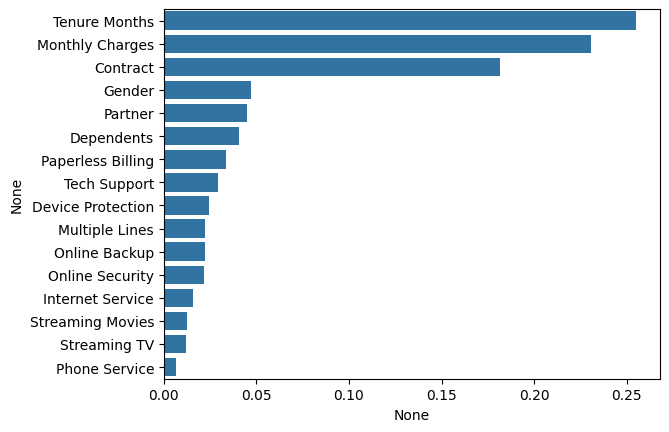

In [279]:
feature_imp = pd.Series(dtc.feature_importances_, index=x.columns).sort_values(ascending=False)

sns.barplot(x=feature_imp, y=feature_imp.index)
plt.show()


Kode tersebut menghitung dan menampilkan tingkat kepentingan (feature importance) dari fitur-fitur pada model Decision Tree Classifier (DTC). Setiap fitur dinilai berdasarkan kontribusinya terhadap keputusan klasifikasi yang dibuat oleh model, kemudian hasilnya divisualisasikan dalam bentuk grafik batang menggunakan library seaborn.

###**Tuning Hyperparameter**

####**GaussianNB**

In [280]:
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB

param_grid = {
    'var_smoothing': np.logspace(0,-9, num=100)
}

grid_search = GridSearchCV(estimator=gnb, param_grid=param_grid, cv=5)

grid_search.fit(x_train_norm, y_train)

print("Parameter terbaik:", grid_search.best_params_)

y_pred_tuned = grid_search.best_estimator_.predict(x_test_norm)

acc_before_tuning = gnb.score(x_test_norm, y_test)
print("Akurasi sebelum tuning:", acc_before_tuning)

acc_after_tuning = grid_search.best_estimator_.score(x_test_norm, y_test)
print("Akurasi setelah tuning:", acc_after_tuning)

Parameter terbaik: {'var_smoothing': 1.0}
Akurasi sebelum tuning: 0.7718883104590629
Akurasi setelah tuning: 0.7709417889256981


Kode tersebut menggunakan GridSearchCV dari scikit-learn untuk mencari parameter terbaik untuk model Gaussian Naive Bayes, dengan mencoba variasi smoothing pada varian. Setelah pencarian parameter, model yang dihasilkan dari grid search dievaluasi terhadap data uji. Hasilnya menunjukkan bahwa setelah penyetelan parameter, akurasi model Gaussian Naive Bayes pada data uji hanya sedikit berubah (0.7709), dengan parameter terbaik yang dipilih adalah var_smoothing = 1.0.

####**K-Nearest Neighbors**

In [282]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
import numpy as np

param_grid = {
    'n_neighbors': range(1, 21),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

knn = KNeighborsClassifier()

grid_search = GridSearchCV(estimator=knn, param_grid=param_grid, cv=5)

grid_search.fit(x_train_norm, y_train)

print("Best Parameters:", grid_search.best_params_)

y_pred_tuned = grid_search.best_estimator_.predict(x_test_norm)

acc_before_tuning = grid_search.score(x_test_norm, y_test)
print("Accuracy before tuning:", acc_before_tuning)

acc_after_tuning = grid_search.best_estimator_.score(x_test_norm, y_test)
print("Accuracy after tuning:", acc_after_tuning)


Best Parameters: {'metric': 'manhattan', 'n_neighbors': 20, 'weights': 'uniform'}
Accuracy before tuning: 0.7789872219592996
Accuracy after tuning: 0.7789872219592996



Kode tersebut menggunakan GridSearchCV dari scikit-learn untuk mencari parameter terbaik untuk model KNeighborsClassifier, dengan rentang nilai tertentu untuk jumlah tetangga (n_neighbors), jenis bobot (weights), dan metrik jarak (metric). Setelah pencarian parameter, model yang dihasilkan dari grid search dievaluasi terhadap data uji. Hasilnya menunjukkan bahwa setelah penyetelan parameter, akurasi model KNeighborsClassifier pada data uji tidak berubah (0.7789), dengan parameter terbaik yang dipilih adalah menggunakan metrik jarak manhattan, 20 tetangga, dan bobot uniform.

####**Decision Tree Classifier**

In [283]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

dt_classifier = DecisionTreeClassifier()

grid_search_dt = GridSearchCV(estimator=dt_classifier, param_grid=param_grid, cv=5)

grid_search_dt.fit(x_train_norm, y_train)

print("Best Parameters:", grid_search_dt.best_params_)

y_pred_dt_tuned = grid_search_dt.best_estimator_.predict(x_test_norm)

acc_dt_before_tuning = grid_search_dt.score(x_test_norm, y_test)
print("Accuracy before tuning:", acc_dt_before_tuning)

acc_dt_after_tuning = grid_search_dt.best_estimator_.score(x_test_norm, y_test)
print("Accuracy after tuning:", acc_dt_after_tuning)

Best Parameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2}
Accuracy before tuning: 0.7681022243256034
Accuracy after tuning: 0.7681022243256034



Grid search cross-validation digunakan untuk mencari kombinasi parameter terbaik untuk Decision Tree Classifier menggunakan kriteria gini, maksimum kedalaman pohon 10, dan jumlah sampel minimum di daun 4 dengan pembagian sampel minimum 2. Setelah penyetelan, akurasi model pada data uji adalah sekitar 76.81%.

####**K-Means**

In [284]:
param_grid = {
    'n_clusters': [3, 4, 5, 6],
    'init': ['k-means++', 'random'],
    'algorithm': ['lloyd', 'elkan']
}

best_score = -1
best_params = None

for n_clusters in param_grid['n_clusters']:
    for init in param_grid['init']:
        for algorithm in param_grid['algorithm']:
            kmeans = KMeans(n_clusters=n_clusters, init=init, algorithm=algorithm, random_state=42, n_init='auto')
            labels = kmeans.fit_predict(x_final_norm)
            silhouette_avg = silhouette_score(x_final_norm, labels)
            print("Silhouette Score:", silhouette_avg, "dengan n_clusters =", n_clusters, ", init =", init, ", algorithm =", algorithm)
            if silhouette_avg > best_score:
                best_score = silhouette_avg
                best_params = {'n_clusters': n_clusters, 'init': init, 'algorithm': algorithm}

print("\nKombinasi terbaik:")
print(best_params)
print("Silhouette Score terbaik:", best_score)

Silhouette Score: 0.12653920283401213 dengan n_clusters = 3 , init = k-means++ , algorithm = lloyd
Silhouette Score: 0.12653920283401213 dengan n_clusters = 3 , init = k-means++ , algorithm = elkan
Silhouette Score: 0.12657164400110385 dengan n_clusters = 3 , init = random , algorithm = lloyd
Silhouette Score: 0.12657164400110385 dengan n_clusters = 3 , init = random , algorithm = elkan
Silhouette Score: 0.11650341923437406 dengan n_clusters = 4 , init = k-means++ , algorithm = lloyd
Silhouette Score: 0.11650341923437406 dengan n_clusters = 4 , init = k-means++ , algorithm = elkan
Silhouette Score: 0.12233307994052066 dengan n_clusters = 4 , init = random , algorithm = lloyd
Silhouette Score: 0.12233307994052066 dengan n_clusters = 4 , init = random , algorithm = elkan
Silhouette Score: 0.10918721700572974 dengan n_clusters = 5 , init = k-means++ , algorithm = lloyd
Silhouette Score: 0.10918721700572974 dengan n_clusters = 5 , init = k-means++ , algorithm = elkan
Silhouette Score: 0.11

Dalam pencarian kombinasi terbaik untuk model KMeans, dengan menggunakan kriteria silhouette score tertinggi, ditemukan bahwa pengaturan terbaik adalah dengan menggunakan 3 cluster, inisialisasi random, dan algoritma Lloyd, yang menghasilkan silhouette score sebesar 0.12657164400110385.

####**Hierical CLustering**

In [285]:
param_grid = {
    'linkage': ['complete', 'average', 'single'],
    'metric': ['euclidean', 'manhattan', 'cosine']
}

best_score = -1
best_params = None

for metric in param_grid['metric']:
  for linkage in param_grid['linkage']:
    hierarchical_clustering = AgglomerativeClustering(n_clusters=3, metric= metric, linkage= linkage)
    labels = hierarchical_clustering.fit_predict(x_final_norm)
    silhouette_avg = silhouette_score(x_final_norm, labels)
    print("Silhouette Score:", silhouette_avg, "dengan kombinasi metric =",metric, ",linkage =",linkage)
    if silhouette_avg > best_score:
                best_score = silhouette_avg
                best_params = {'metric': metric, 'linkage': linkage}

hierarchical_clustering = AgglomerativeClustering(n_clusters=3, metric= 'euclidean', linkage= 'ward')
labels = hierarchical_clustering.fit_predict(x_final_norm)
silhouette_avg = silhouette_score(x_final_norm, labels)
print('-'*100)
print("\nDi bawah ini merupakan score dari model Hierical clustering yang digunakan sebelumnya pada Modelling Associate")
print("Silhouette Score:", silhouette_avg, "dengan kombinasi metric = eulicidan, linkage = ward")
print('-'*100)
print("\nKombinasi terbaik:")
print(best_params)
print("Silhouette Score terbaik:", best_score)

Silhouette Score: 0.1131931327687964 dengan kombinasi metric = euclidean ,linkage = complete
Silhouette Score: 0.13971003736935636 dengan kombinasi metric = euclidean ,linkage = average
Silhouette Score: 0.0512609161901784 dengan kombinasi metric = euclidean ,linkage = single
Silhouette Score: 0.10384665491685106 dengan kombinasi metric = manhattan ,linkage = complete
Silhouette Score: 0.1280634426455042 dengan kombinasi metric = manhattan ,linkage = average
Silhouette Score: 0.05743996946121709 dengan kombinasi metric = manhattan ,linkage = single
Silhouette Score: 0.02858334473856908 dengan kombinasi metric = cosine ,linkage = complete
Silhouette Score: -0.01140339265206766 dengan kombinasi metric = cosine ,linkage = average
Silhouette Score: -0.047936921116757736 dengan kombinasi metric = cosine ,linkage = single
----------------------------------------------------------------------------------------------------

Di bawah ini merupakan score dari model Hierical clustering yang digun

Dalam pencarian kombinasi terbaik untuk model Hierarchical Clustering, kriteria silhouette score tertinggi ditemukan pada pengaturan metrik Euclidean dan metode linkage Average, dengan silhouette score sebesar 0.13971003736935636, mengungguli pengaturan sebelumnya yang menggunakan metode Ward.

##**Determine Next Step**

In [286]:
gnb.fit(x_train_norm, y_train)
gnb_pred = gnb.predict(x_test_norm)
x_test = pd.DataFrame(x_test).reset_index(drop=True)
y_test = pd.DataFrame(y_test).reset_index(drop=True)
gnb_col_new = pd.DataFrame(gnb_pred.astype(int), columns=["gnb_col_new"])

In [287]:
combined_data = pd.concat([x_test, y_test, gnb_col, gnb_col_new], axis=1)

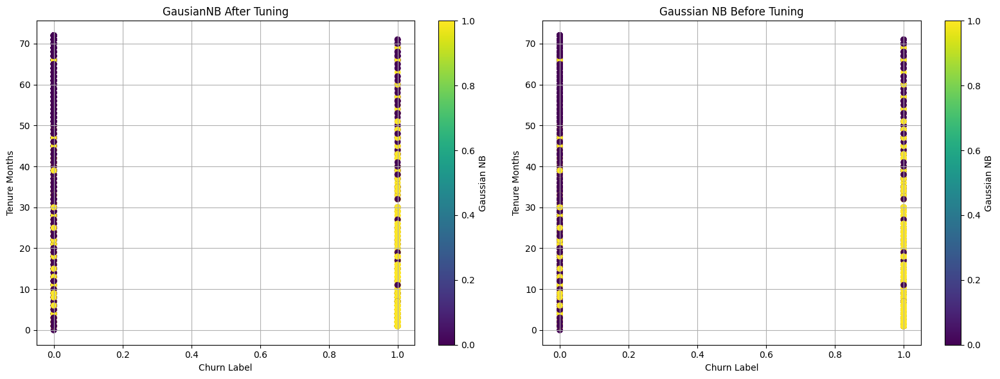

In [296]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].scatter(combined_data['Churn Label'], combined_data['Tenure Months'], c=combined_data["gnb_col_new"], cmap='viridis')
axes[0].set_xlabel('Churn Label')
axes[0].set_ylabel('Tenure Months')
axes[0].set_title('GausianNB After Tuning')
axes[0].grid(True)
fig.colorbar(axes[0].collections[0], ax=axes[0], label='Gaussian NB')

axes[1].scatter(combined_data['Churn Label'], combined_data['Tenure Months'], c=combined_data["gnb_prediction"], cmap='viridis')
axes[1].set_xlabel('Churn Label')
axes[1].set_ylabel('Tenure Months')
axes[1].set_title('Gaussian NB Before Tuning')
axes[1].grid(True)
fig.colorbar(axes[1].collections[0], ax=axes[1], label='Gaussian NB')

plt.tight_layout()
plt.show()

###**Kesimpulan**

Setelah penyetelan parameter menggunakan GridSearchCV, model Gaussian Naive Bayes mengalami sedikit perubahan dalam akurasi pada data uji (0.7709) dengan var_smoothing = 1.0. KNeighborsClassifier tidak mengalami perubahan dalam akurasi pada data uji (0.7789) dengan metrik jarak Manhattan, 20 tetangga, dan bobot uniform. Decision Tree Classifier mencapai akurasi sekitar 76.81% setelah penyetelan dengan kriteria gini, maksimum kedalaman pohon 10, dan jumlah sampel minimum di daun 4. KMeans mencapai silhouette score tertinggi (0.1266) dengan 3 cluster, inisialisasi random, dan algoritma Lloyd. Hierarchical Clustering mencapai silhouette score tertinggi (0.1397) dengan metrik Euclidean dan metode linkage Average.

